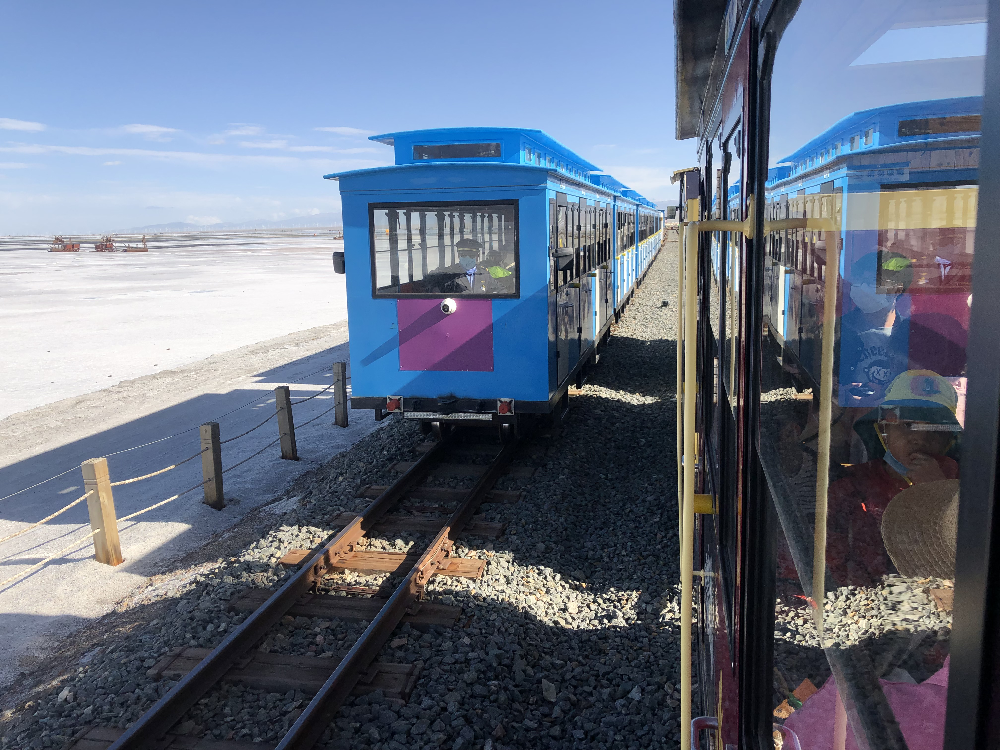

In [267]:
from cgitb import small
import os
from PIL import Image
import numpy as np

def getSmallImages(images_directory):
    image_files = os.listdir(images_directory)
    images = []
    for file in image_files:
        filepath = os.path.join(images_directory,file)
        try:
            img = Image.open(filepath).convert('RGB')
            images.append(img)
        except:
            print("Invalid Small Image:{}".format(filepath))
    return images

def processImages(images, method = 'RESIZE'):
    processed_images = []
    if(method == 'CROP'):
        for img in images:
            w,h = img.size
            l = min(w,h)
            left = (w-l)/2
            right = w - left
            top = (h-l)/2
            bottom = h - top
            processed = img.crop((left,top,right,bottom))
            processed_images.append(processed)
    elif(method == 'RESIZE'):
        for img in images:
            l = min(img.size[:])
            processed = img.resize((l,l))
            processed_images.append(processed)
    else:
        print("ERR! PROCESS METHOD NOT SUPPORTED!")
    return processed_images

# small_images = getSmallImages('./pics/smalls/')
small_images = getSmallImages('./pics/phone/')
# smallImages = processImages(smallImages, method = 'CROP')
# small_images = processImages(small_images, method = 'RESIZE')
small_images[0]

In [268]:
def getAvgRGB(image):
    im = np.array(image)
    w, h, d = im.shape
    return np.mean(im.reshape(w*h, d), axis=0)

getAvgRGB(small_images[0])


array([103.40861419, 113.16438499, 130.76533688])

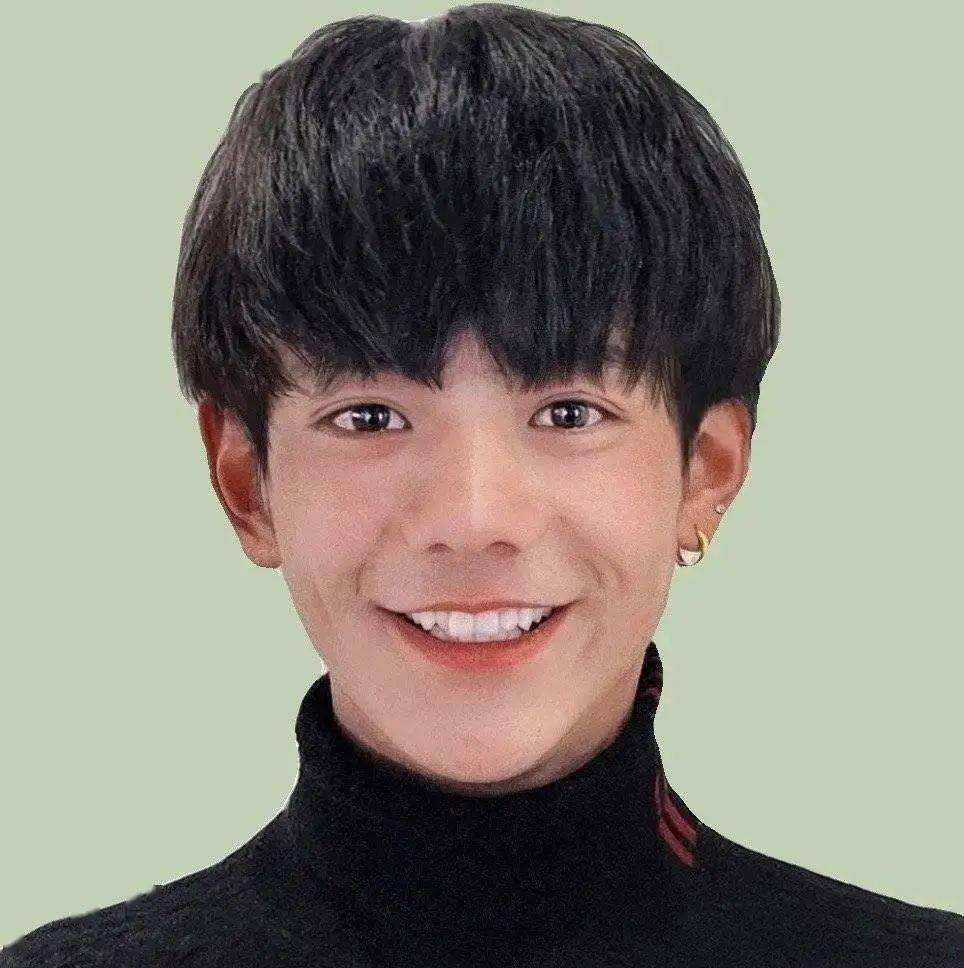

In [269]:
def getBigImage(filepath):
    try:
        image = Image.open(filepath)
    except:
        print("Invalid Big Image:{}".format(filepath))
    return image

big_image = getBigImage('./pics/bigs/1.jpeg')
big_image

In [270]:
def findBestMatchIndex(chunkAvgRGB, smallImagesAvgRGBs):
    index = 0
    min_dist = 255**3
    for i in range(len(smallImagesAvgRGBs)):
        tmp_dist  = np.linalg.norm(smallImagesAvgRGBs[i] - chunkAvgRGB)
        if(tmp_dist < min_dist):
            index = i
            min_dist = tmp_dist
    return index

def createPhotoMosaics(image, chunk_side = 1):
    # resize images to square: (chunkSide*chunkSide)
    resized_small_images = []
    for img in small_images:
        resized = img.resize((chunk_side,chunk_side))
        resized_small_images.append(resized)  
    # get images' avg rgbs
    small_images_avg_rgbs = []
    for img in small_images:
        small_images_avg_rgbs.append(getAvgRGB(img))

    np_image = np.array(image)
    w, h = image.size
    W, H = int(w/chunk_side), int(h/chunk_side)
    result_img = Image.new('RGB',(W*chunk_side, H*chunk_side))

    for j in range(H):
        for i in range(W):
            chunkImg = np_image[j*chunk_side:(j+1)*chunk_side, i*chunk_side:(i+1)*chunk_side]
            chunkAvgRGB = np.mean(chunkImg.reshape(chunk_side*chunk_side,3),axis = 0)
            index = findBestMatchIndex(chunkAvgRGB, small_images_avg_rgbs)
            result_img.paste(resized_small_images[index],(i*chunk_side, j*chunk_side))
    return result_img
    
# save images
pms = []
for i in range(4,60,20):
    pm = createPhotoMosaics(big_image, i)
    pm.save("chunkSide{}.jpeg".format(i),'jpeg')
    pms.append(pm)
for pm in pms:
    pm.show()